# Assignment_5

## Monte Carlo vs Temporal Difference Learning: Value Function Estimation in a Random Walk Environment

Simple Description of the Assignment

> Add blockquote



reproduceing a visualization that compares two fundamental reinforcement learning methods:

Monte Carlo (MC)

– learns from a full episode

Temporal Difference (TD(0))

– learns during the episode step-by-step

To do this, we will:

1-Build a simple environment (Random Walk)

2-Generate episodes of experience

3-Implement Monte Carlo learning

4-Implement TD(0) learning

5-Record how the value function changes

6-Visualize & animate how both algorithms learn over time

### IMPORTS

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

### Random Walk Environment

In [6]:
class RandomWalkEnv:
    """
    Random Walk environment: states 0..6, terminal states 0 and 6.
    Start at state 3. Reward = +1 for reaching right terminal.
    """
    def __init__(self, n_states=7):
        self.n_states = n_states
        self.terminal_states = [0, n_states - 1]
        self.start_state = n_states // 2
        self.reset()

    def reset(self):
        self.state = self.start_state
        return self.state

    def step(self):
        move = np.random.choice([-1, 1])
        next_state = self.state + move
        next_state = max(0, min(self.n_states - 1, next_state))

        reward = 1 if next_state == self.terminal_states[1] else 0
        done = next_state in self.terminal_states

        self.state = next_state
        return next_state, reward, done

    def generate_episode(self):
        states = [self.reset()]
        rewards = []
        while True:
            s_next, r, done = self.step()
            states.append(s_next)
            rewards.append(r)
            if done:
                break
        return states, rewards


### Monte Carlo Prediction

In [7]:
def monte_carlo(env, episodes=50, gamma=1.0, alpha=0.1):
    V = np.zeros(env.n_states)
    V_history = []
    returns_history = []

    for ep in range(episodes):
        states, rewards = env.generate_episode()

        # Compute return G backward
        G = 0
        returns = []
        for r in reversed(rewards):
            G = r + gamma * G
            returns.append(G)
        returns.reverse()

        visited = set()
        for t in range(len(states)-1):
            s = states[t]
            if s not in visited:
                visited.add(s)
                V[s] += alpha * (returns[t] - V[s])

        V_history.append(V.copy())
        returns_history.append(sum(rewards))

    return V, V_history, returns_history


### TD

In [8]:
def td_learning(env, episodes=50, gamma=1.0, alpha=0.1):
    V = np.zeros(env.n_states)
    V_history = []
    returns_history = []

    for ep in range(episodes):
        s = env.reset()
        done = False
        ep_rewards = []

        while not done:
            s_next, r, done = env.step()
            ep_rewards.append(r)

            V[s] += alpha * (r + gamma * V[s_next] - V[s])
            s = s_next
            V_history.append(V.copy())

        returns_history.append(sum(ep_rewards))

    return V, V_history, returns_history


Plotting value function

In [9]:
def plot_value_functions(env, V_mc, V_td):
    nonterm = list(range(1, env.n_states-1))
    true_v = np.array([s / (env.n_states - 1) for s in range(env.n_states)])

    plt.figure(figsize=(8,5))
    plt.plot(nonterm, true_v[nonterm], "k--", label="True V(s)")
    plt.plot(nonterm, V_mc[nonterm], "o-", label="Monte Carlo")
    plt.plot(nonterm, V_td[nonterm], "s-", label="TD(0)")
    plt.title("Monte Carlo vs TD(0)")
    plt.xlabel("State")
    plt.ylabel("Value")
    plt.grid(True)
    plt.legend()
    plt.show()


### Animation

In [10]:
def animate_learning(history, title):
    fig, ax = plt.subplots(figsize=(6,4))
    ax.set_ylim(-0.1, 1.1)
    ax.set_xlim(1, 5)
    line, = ax.plot([], [], "o-")

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        V = history[frame]
        x = [1,2,3,4,5]
        line.set_data(x, V[1:6])
        ax.set_title(f"{title} — Step {frame+1}")
        return line,

    anim = FuncAnimation(fig, update, frames=len(history),
                         init_func=init, interval=120, blit=True)
    plt.close(fig)
    return anim


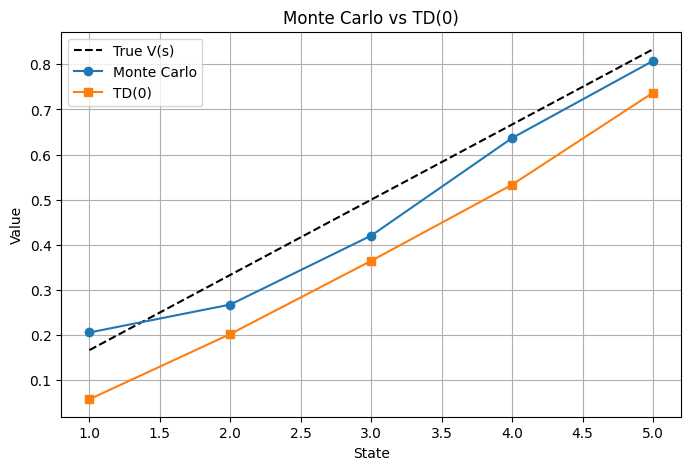

In [11]:
env = RandomWalkEnv()

V_mc, mc_hist, mc_returns = monte_carlo(env, episodes=50, alpha=0.1)
V_td, td_hist, td_returns = td_learning(env, episodes=50, alpha=0.1)

plot_value_functions(env, V_mc, V_td)

from IPython.display import HTML
HTML( animate_learning(mc_hist, "Monte Carlo Learning").to_jshtml() )
HTML( animate_learning(td_hist, "TD Learning").to_jshtml() )
